# Camera Calibration and Distortion Correction

Processing Image 20 of 20

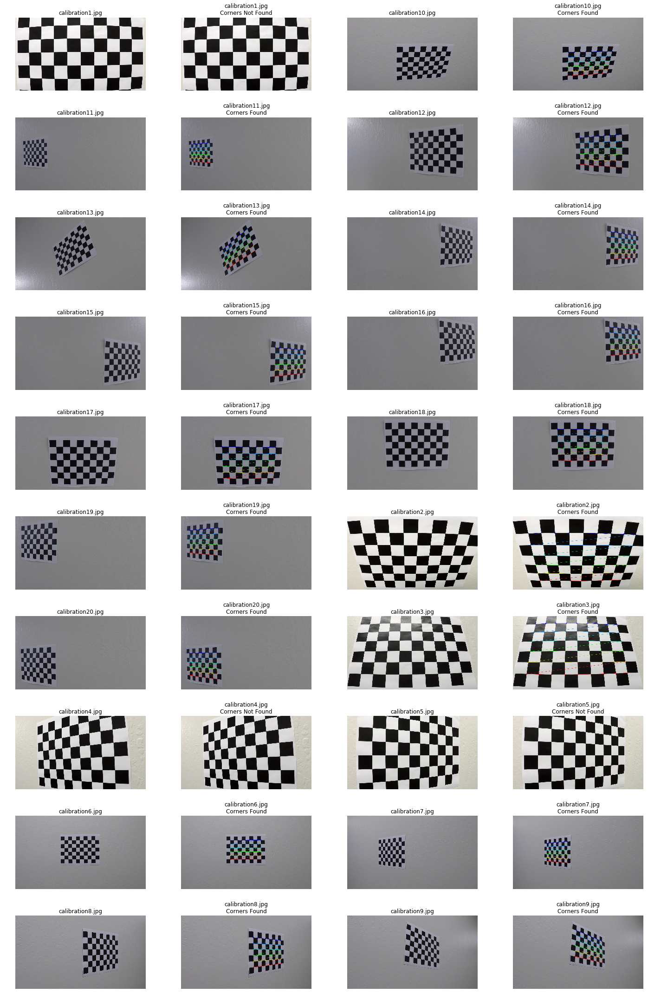

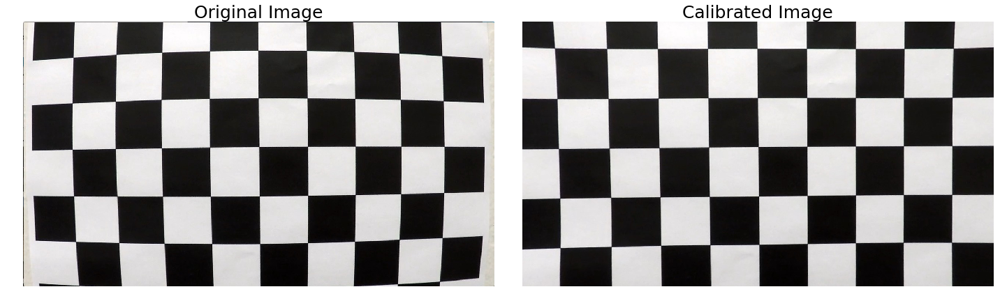

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import os, os.path
import sys
import math
import pickle

nx = 9
ny = 6

#Create variables
object_points = []
image_points = []
raw_images = []
images = []
corner_images = []
corners_found = []

obj_pts = np.zeros((nx*ny, 3), np.float32)
obj_pts[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Load filenames
files = sorted(os.listdir("camera_cal"))
num_files = len(files)
this_file = 0

for file in files:
    this_file += 1
    sys.stdout.write("\rProcessing Image %i of %i" % (this_file, num_files))
    sys.stdout.flush()
    
    #Read image, convert to RGB and Grayscale
    image = cv2.imread('camera_cal/'+file)
    images.append(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    #Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray_image, (nx, ny), None)
    
    corners_found.append(ret)
    
    #If found, save corners to list and draw corners on image
    if ret:
        image_points.append(corners)
        object_points.append(obj_pts)
        corner_img = cv2.drawChessboardCorners(image, (nx,ny), corners, ret)
        corner_images.append(corner_img)
    
    else:
        corner_images.append(image)
        
#Perform camera calibration
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, gray_image.shape[::-1], None, None)

#Save calibration information to pickle dictionary
camera_cal = {}
camera_cal["mtx"] = mtx
camera_cal["dist"] = dist
camera_cal["rvecs"] = rvecs
camera_cal["tvecs"] = tvecs
pickle.dump( camera_cal, open("calibration.p", "wb"))

#Plot all images
fig_1 = plt.figure(figsize = (20,30))
img_index = 0
plot_pos = 1

for file in files:
    
    a = fig_1.add_subplot(10,4,plot_pos)
    a.set_title(file)
    plt.axis('off')
    plt.imshow(images[img_index])
    plot_pos += 1
    
    a = fig_1.add_subplot(10,4,plot_pos)
    if corners_found[img_index]:
        a.set_title(file + '\nCorners Found')
    else:
        a.set_title(file + '\nCorners Not Found')   
    plt.axis('off')
    plt.imshow(corner_images[img_index])
    plot_pos += 1    
    
    img_index += 1
        
fig_1.tight_layout()
plt.show()

#Figure for Writeup
out_fig = plt.figure(figsize = (20, 8))

a = out_fig.add_subplot(1,2,1)
a.set_title('Original Image', fontsize=25)
plt.axis('off')
plt.imshow(images[0])

a = out_fig.add_subplot(1,2,2)
a.set_title('Calibrated Image', fontsize=25)
plt.axis('off')
plt.imshow(cv2.undistort(images[0], mtx, dist, None, mtx))

out_fig.tight_layout()
out_fig.savefig('output_images/calibration_fig.png')
plt.show()
    
    


# Perspective Transform

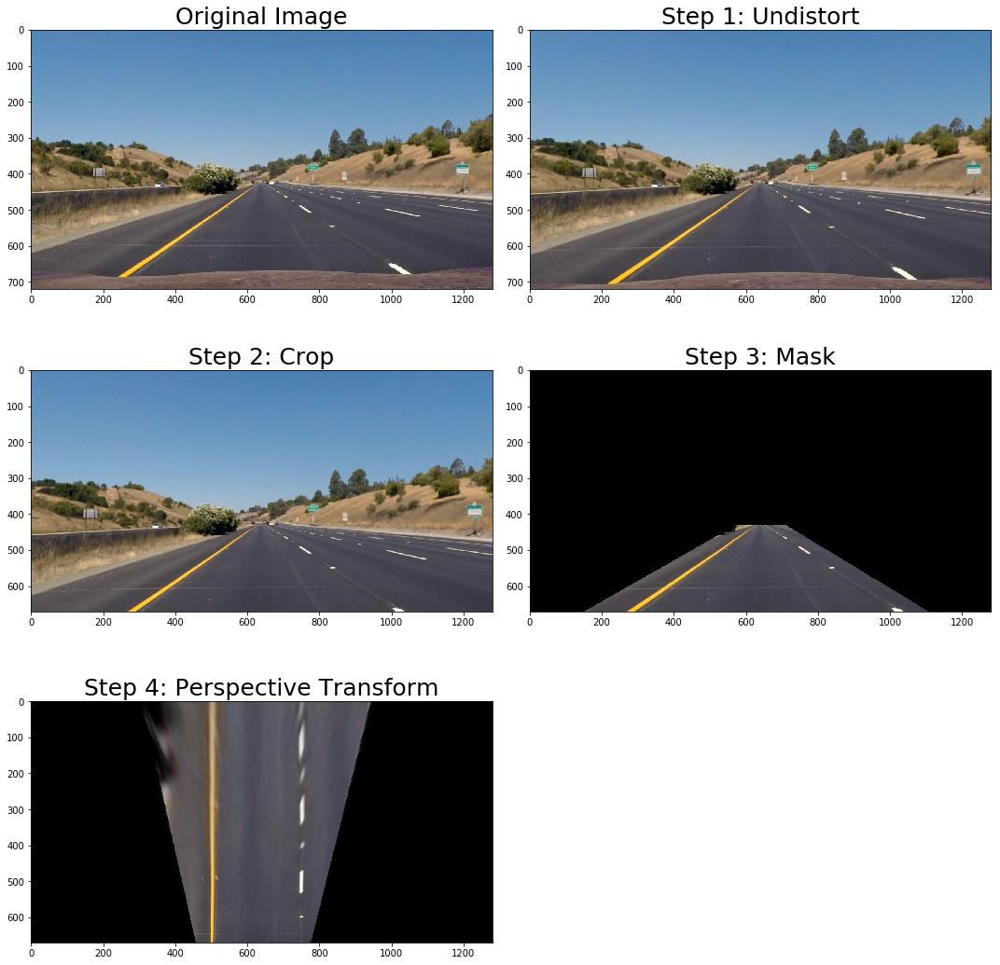

In [24]:
def undistort(img, mtx, dist):
    """
    Simple undistort wrapper
    """
    dest = cv2.undistort(img, mtx, dist, None, mtx)
    return dest

def undistort_cal(img):
    """
    Undistorts the image using the calibration values calculated from the checker board images
    """
    
    cal = pickle.load(open("calibration.p", "rb"))
    mix = cal["mtx"]
    dist = cal["dist"]
    dest = cv2.undistort(img, mtx, dist, None, mtx)
    return dest

def crop(img):
    """
    Crops out the bottom portion of the image that contains the car hood
    """
    img = img[0:670, :]
    return img

def roi(img):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    vertices = np.array([ [150, 670], [570,430], [710,430], [1105, 670] ])
    
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, [vertices], ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def perspective(img, inverse=False):
    """
    Perofrms perspective transform on image in order to achieve bird's-eye view.
    If the inverser flag is true, it will perfom the inverser warp back to a normal
    camera perspective
    """
    source = np.float32(
    [[283, 665],
    [595, 450],
    [684,450],
    [1022, 665]])
    
    dest = np.float32(
    [[500, 670],
    [500, 100],
    [750, 100],
    [750, 670]])
    
    if (inverse == False):
        M = cv2.getPerspectiveTransform(source, dest)
        warped = cv2.warpPerspective(img, M, img.shape[1::-1], flags=cv2.INTER_LANCZOS4)
    elif (inverse == True):
        Minv = cv2.getPerspectiveTransform(dest, source)
        warped = cv2.warpPerspective(img, Minv, img.shape[1::-1], flags=cv2.INTER_LANCZOS4)
    return warped


#Plot iamges to demostrate image manipulations
test = cv2.cvtColor(cv2.imread('test_images/straight_lines1.jpg'), cv2.COLOR_BGR2RGB)

fig_2 = plt.figure(figsize = (15,15))

a = fig_2.add_subplot(3,2,1)
a.set_title('Original Image', fontsize = 25)
plt.imshow(test)

a = fig_2.add_subplot(3,2,2)
a.set_title('Step 1: Undistort', fontsize = 25)
plt.imshow(undistort_cal(test))

a = fig_2.add_subplot(3,2,3)
a.set_title('Step 2: Crop', fontsize = 25)
plt.imshow(crop(undistort_cal(test)))

a = fig_2.add_subplot(3,2,4)
a.set_title('Step 3: Mask', fontsize = 25)
plt.imshow(roi(crop(undistort_cal(test))))

a = fig_2.add_subplot(3,2,5)
a.set_title('Step 4: Perspective Transform', fontsize = 25)
plt.imshow(perspective(roi(crop(undistort_cal(test))), False))

fig_2.tight_layout()
plt.savefig('output_images/image_manip_steps.png')
plt.show()



    


# Colorspace, Gradient and Thresholds
## Colorspace

Here we will visualize colorspaces in grayscale.  We are looking to find specific channels that offer high contrast for yellow and/or white lane lines.

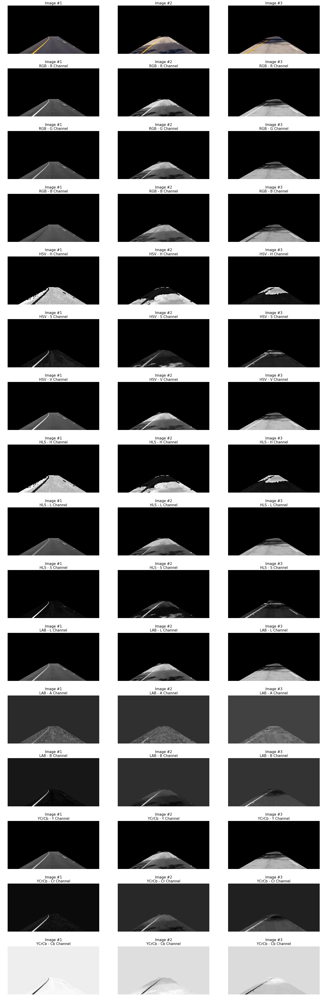

In [25]:
files = sorted(os.listdir("test_images"))
num_files = len(files)
vertices = np.array([ [150, 670], [600,430], [700,430], [1105, 670] ])

img1 = roi(crop(undistort_cal(cv2.imread('test_images/test2.jpg'))))
img2 = roi(crop(undistort_cal(cv2.imread('test_images/test4.jpg'))))
img3 = roi(crop(undistort_cal(cv2.imread('test_images/test5.jpg'))))

images = [img1, img2, img3]

fig_5 = plt.figure(figsize=(20, 60))
i_num = 1

#Convert each image into 5 different colorspaces and plot each channel for each colorspace as a grayscale image
for image in images:
    
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    ycrcb = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
    
    a = fig_5.add_subplot(16 ,3, i_num)
    a.set_title('Image #{:.0f}'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    
    a = fig_5.add_subplot(16 ,3, i_num+3)
    a.set_title('Image #{:.0f}\nRGB - R Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(rgb[:,:,0], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+6)
    a.set_title('Image #{:.0f}\nRGB - G Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(rgb[:,:,1], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+9)
    a.set_title('Image #{:.0f}\nRGB - B Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(rgb[:,:,2], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+12)
    a.set_title('Image #{:.0f}\nHSV - H Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(hsv[:,:,0], cmap='gray')
    
    a = fig_5.add_subplot(16,3, i_num+15)
    a.set_title('Image #{:.0f}\nHSV - S Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(hsv[:,:,1], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+18)
    a.set_title('Image #{:.0f}\nHSV - V Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(hsv[:,:,2], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+21)
    a.set_title('Image #{:.0f}\nHLS - H Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(hls[:,:,0], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+24)
    a.set_title('Image #{:.0f}\nHLS - L Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(hls[:,:,1], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+27)
    a.set_title('Image #{:.0f}\nHLS - S Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(hls[:,:,2], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+30)
    a.set_title('Image #{:.0f}\nLAB - L Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(lab[:,:,0], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+33)
    a.set_title('Image #{:.0f}\nLAB - A Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(lab[:,:,1], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+36)
    a.set_title('Image #{:.0f}\nLAB - B Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(lab[:,:,2], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+39)
    a.set_title('Image #{:.0f}\nYCrCb - Y Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(ycrcb[:,:,0], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+42)
    a.set_title('Image #{:.0f}\nYCrCb - Cr Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(ycrcb[:,:,1], cmap='gray')
    
    a = fig_5.add_subplot(16 ,3, i_num+45)
    a.set_title('Image #{:.0f}\nYCrCb - Cb Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(ycrcb[:,:,2], cmap='gray')
    
    i_num +=1
    
fig_5.tight_layout()
plt.savefig('output_images/colorspaces.png')
plt.show()
    
    
    
    
    
    

## Gradient
Here we are lookingt o visualize the gradient of the image in both the x and y directions.  We are again looking for a gradient direciton and threshold that will help us detect the lane lines.

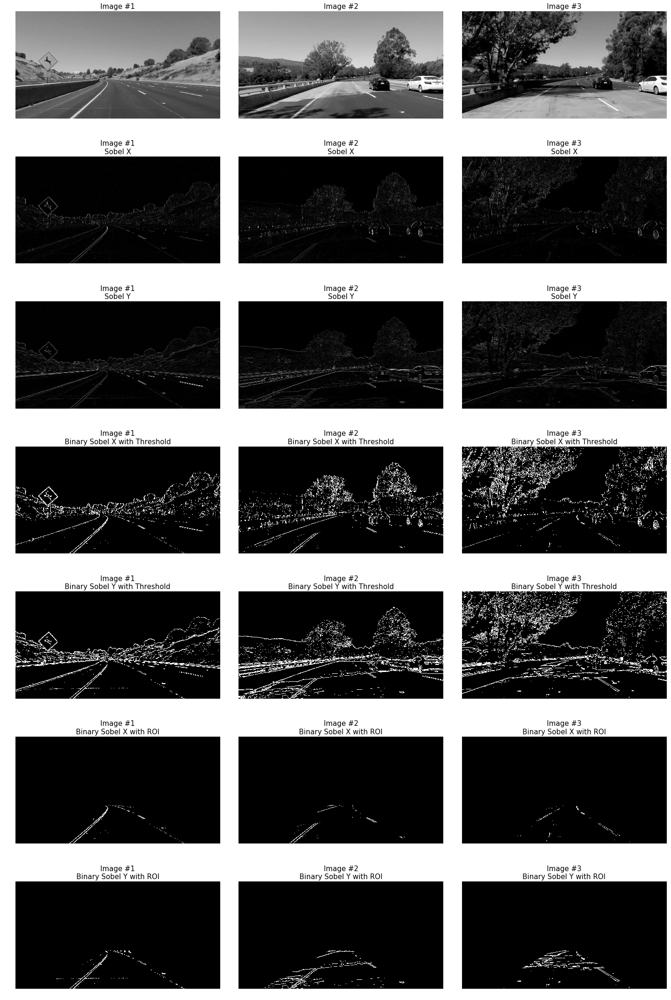

In [26]:
img1 = cv2.cvtColor(crop(undistort_cal(cv2.imread('test_images/test2.jpg'))), cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(crop(undistort_cal(cv2.imread('test_images/test4.jpg'))), cv2.COLOR_BGR2GRAY)
img3 = cv2.cvtColor(crop(undistort_cal(cv2.imread('test_images/test5.jpg'))), cv2.COLOR_BGR2GRAY)

images = [img1, img2, img3]

fig_6 = plt.figure(figsize=(20,30))
i_num = 1

threshx = (25,150)
threshy = (25,150)

for image in images:
    
    #Use Sobel operator for gradient in X direction and scale to 0-255
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    #Use Sobel operator for gradient in Y direction and scale to 0-255
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1)
    abs_sobely = np.absolute(sobely)
    scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
    
    #Threshold pixel values to return binary iamges
    sxbin = np.zeros_like(scaled_sobelx)
    sxbin[(scaled_sobelx >= threshx[0]) & (scaled_sobelx <= threshx[1])] = 1
    
    sybin = np.zeros_like(scaled_sobely)
    sybin[(scaled_sobely >= threshy[0]) & (scaled_sobely <= threshy[1])] = 1
    
    a = fig_6.add_subplot(7 ,3, i_num)
    a.set_title('Image #{:.0f}'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(image, cmap='gray')
    
    a = fig_6.add_subplot(7 ,3, i_num+3)
    a.set_title('Image #{:.0f}\nSobel X'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(scaled_sobelx, cmap='gray')
    
    a = fig_6.add_subplot(7 ,3, i_num+6)
    a.set_title('Image #{:.0f}\nSobel Y'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(scaled_sobely, cmap='gray')
    
    a = fig_6.add_subplot(7 ,3, i_num+9)
    a.set_title('Image #{:.0f}\nBinary Sobel X with Threshold'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(sxbin, cmap='gray')
    
    a = fig_6.add_subplot(7 ,3, i_num+12)
    a.set_title('Image #{:.0f}\nBinary Sobel Y with Threshold'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(sybin, cmap='gray')
    
    a = fig_6.add_subplot(7 ,3, i_num+15)
    a.set_title('Image #{:.0f}\nBinary Sobel X with ROI'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(roi(sxbin), cmap='gray')
    
    a = fig_6.add_subplot(7 ,3, i_num+18)
    a.set_title('Image #{:.0f}\nBinary Sobel Y with ROI'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(roi(sybin), cmap='gray')
    
    i_num += 1
    
    
fig_6.tight_layout()
plt.savefig('output_images/sobel.png')
plt.show()


## Colorspace Thresholds
Here is where we experiment with different threshold values. We want to do our best to detect as much of the lane lines as possible without adding in too many false detections.

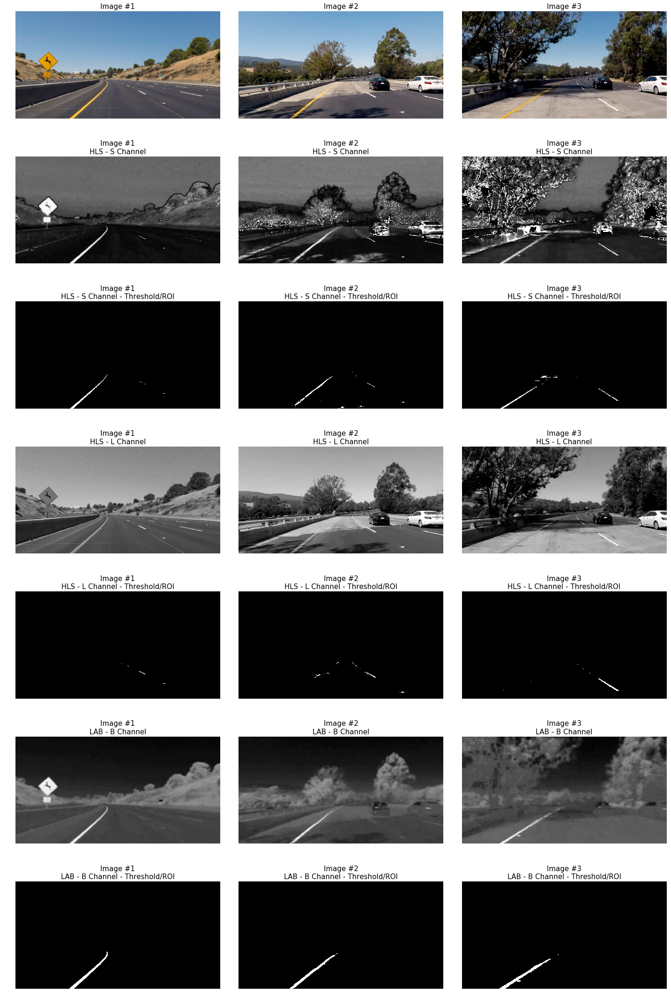

In [27]:
img1 = crop(undistort_cal(cv2.imread('test_images/test2.jpg')))
img2 = crop(undistort_cal(cv2.imread('test_images/test4.jpg')))
img3 = crop(undistort_cal(cv2.imread('test_images/test5.jpg')))

images = [img1, img2, img3]

hls_s_thresh = (175, 255)
hls_l_thresh = (205, 255)
lab_thresh = (145, 255)

fig_7 = plt.figure(figsize=(20,30))

i_num  = 1

for image in images:
    #Convert to HLS and LAB
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    #create binary image for HLS - S channel
    hlssbin = np.zeros_like(hls[:,:,2])
    hlssbin[(hls[:,:,2] >= hls_s_thresh[0]) & (hls[:,:,2] <= hls_s_thresh[1])] = 1
    
    #create binary image for HLS - L channel
    hlslbin = np.zeros_like(hls[:,:,1])
    hlslbin[(hls[:,:,1] >= hls_l_thresh[0]) & (hls[:,:,1] <= hls_l_thresh[1])] = 1
    
    #create binary image for LAB - B channel
    labbbin = np.zeros_like(lab[:,:,2])
    labbbin[(lab[:,:,2] >= lab_thresh[0]) & (lab[:,:,1] <= lab_thresh[1])] = 1
    
    
    a = fig_7.add_subplot(7 ,3, i_num)
    a.set_title('Image #{:.0f}'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    
    a = fig_7.add_subplot(7 ,3, i_num+3)
    a.set_title('Image #{:.0f}\nHLS - S Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(hls[:,:,2], cmap='gray')
    
    a = fig_7.add_subplot(7 ,3, i_num+6)
    a.set_title('Image #{:.0f}\nHLS - S Channel - Threshold/ROI'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(roi(hlssbin), cmap='gray')
    
    a = fig_7.add_subplot(7 ,3, i_num+9)
    a.set_title('Image #{:.0f}\nHLS - L Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(hls[:,:,1], cmap='gray')
    
    a = fig_7.add_subplot(7 ,3, i_num+12)
    a.set_title('Image #{:.0f}\nHLS - L Channel - Threshold/ROI'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(roi(hlslbin), cmap='gray')
               
    a = fig_7.add_subplot(7 ,3, i_num+15)
    a.set_title('Image #{:.0f}\nLAB - B Channel'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(lab[:,:,2], cmap='gray')
               
    a = fig_7.add_subplot(7 ,3, i_num+18)
    a.set_title('Image #{:.0f}\nLAB - B Channel - Threshold/ROI'.format(i_num), fontsize=15)
    plt.axis('off')
    plt.imshow(roi(labbbin), cmap='gray')
    
    i_num += 1

fig_7.tight_layout()
plt.savefig('output_images/color_thresholds.png')
plt.show()





## Combining Colorspaces and Gradients
Here we combine the colorspace and gradient detections to develop a robust way to detect pixels that make up lane lines.  In the images below, the visualization key is as follows:
    - Sobel X: Red
    - LAB Colorspace, L Channel: Blue
    - HLS Colorspace, S Channel: Green

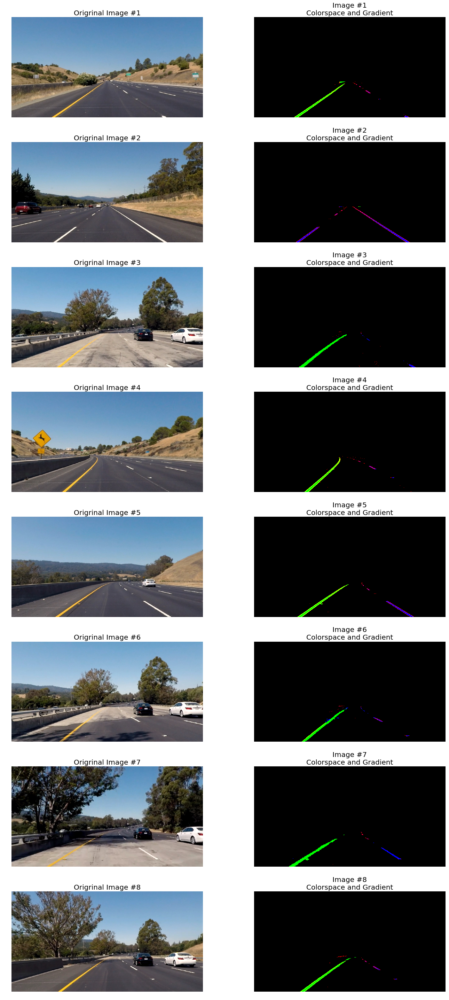

In [28]:
hls_s_thresh = (200, 235)
lab_b_thresh = (145, 255)
hls_l_thresh = (205, 255)
threshx = (50,150)

files = sorted(os.listdir("test_images"))
num_files = len(files)
this_file = 0
i_num = 1

fig_8 = plt.figure(figsize=(20,40))

for file in files:
    
    image = crop(undistort_cal(cv2.imread('test_images/' + file)))
    
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    #Sobel - X direction
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    sxbin = np.zeros_like(scaled_sobelx)
    sxbin[(scaled_sobelx >= threshx[0]) & (scaled_sobelx <= threshx[1])] = 1
    
    #HLS and LAB
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    labbbin = np.zeros_like(lab[:,:,2])
    labbbin[(lab[:,:,2] >= lab_b_thresh[0]) & (lab[:,:,2] <= lab_b_thresh[1])] = 1
    
    hlslbin = np.zeros_like(hls[:,:,1])
    hlslbin[(hls[:,:,1] >= hls_l_thresh[0]) & (hls[:,:,1] <= hls_l_thresh[1])] = 1
    
    #Combine HLS-L, LAB-B and Sobel-X into one image
    combined = np.zeros_like(image)
    combined[:,:,0] = sxbin*255
    combined[:,:,1] = labbbin*255
    combined[:,:,2] = hlslbin*255
    
    #Create a binary iamge from all 3 detection methods
    combined_bin = np.zeros_like(combined)
    combined_bin[(combined > 0)] = 1
    
    a = fig_8.add_subplot(num_files, 2 , i_num*2-1)
    a.set_title('Origrinal Image #{:.0f}'.format(i_num), fontsize=20)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    
    a = fig_8.add_subplot(num_files, 2, i_num*2)
    a.set_title('Image #{:.0f}\nColorspace and Gradient'.format(i_num), fontsize=20)
    plt.axis('off')
    plt.imshow(roi(combined))
    
    i_num += 1
    
fig_8.tight_layout()
plt.savefig('output_images/colorspace_gradient_normal.png')
plt.show()
    
    
    


## Combined Lane Line Detection and Perspective Transform
Now we can visualize the detected lane lines from a top-down or birds-eye perspective.  This will allow us to fit a line to our detected points with polynomial regression.

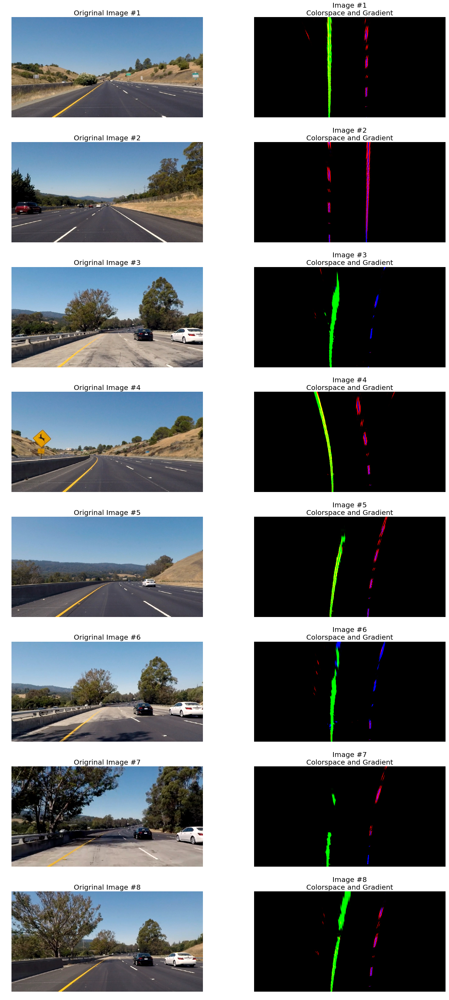

In [29]:
lab_b_thresh = (145, 255)
hls_l_thresh = (205, 255)
threshx = (55,150)

files = sorted(os.listdir("test_images"))
num_files = len(files)
this_file = 0
i_num = 1

fig_9 = plt.figure(figsize=(20,40))

for file in files:
    
    image = crop(undistort_cal(cv2.imread('test_images/' + file)))
    
    #Sobel - X direction
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    sxbin = np.zeros_like(scaled_sobelx)
    sxbin[(scaled_sobelx >= threshx[0]) & (scaled_sobelx <= threshx[1])] = 1
    
    #HLS and LAB
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    labbbin = np.zeros_like(lab[:,:,2])
    labbbin[(lab[:,:,2] >= lab_b_thresh[0]) & (lab[:,:,2] <= lab_b_thresh[1])] = 1
    
    hlslbin = np.zeros_like(hls[:,:,1])
    hlslbin[(hls[:,:,1] >= hls_l_thresh[0]) & (hls[:,:,1] <= hls_l_thresh[1])] = 1
    
    #Combine HLS-L, LAB-B and Sobel-X into one image
    combined = np.zeros_like(image)
    combined[:,:,0] = sxbin*255
    combined[:,:,1] = labbbin*255
    combined[:,:,2] = hlslbin*255
    
    #Create a binary iamge from all 3 detection methods
    combined_bin = np.zeros_like(combined)
    combined_bin[(combined > 0)] = 1
    
    a = fig_9.add_subplot(num_files, 2 , i_num*2-1)
    a.set_title('Origrinal Image #{:.0f}'.format(i_num), fontsize=20)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    
    a = fig_9.add_subplot(num_files, 2, i_num*2)
    a.set_title('Image #{:.0f}\nColorspace and Gradient'.format(i_num), fontsize=20)
    plt.axis('off')
    plt.imshow(perspective(roi(combined), False))
    
    i_num += 1
    
fig_9.tight_layout()
plt.savefig('output_images/colorspace_gradient_birdseye.png')
plt.show()

# Finding Lane Lines
## Sliding Window Search
Here we explore the sliding window search in order to fit a line to our detection points.  We first us a historgram across the lower half of the pixels to find the X-intercept of each lane line.  We can locate these points by finding the two (left and right) peaks in the histogram.  From there we use sliding windows to fid the rest of the lane line pixels.

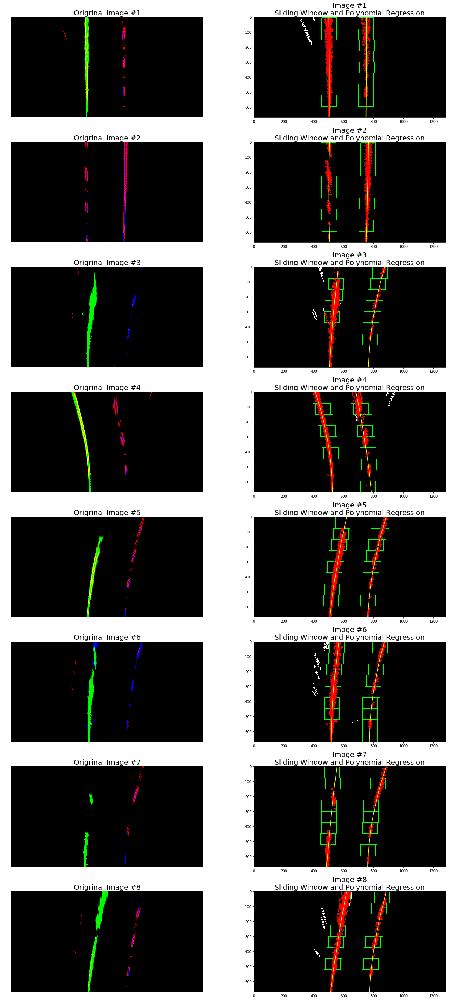

In [30]:
lab_b_thresh = (145, 255)
hls_l_thresh = (205, 255)
threshx = (55,150)

files = sorted(os.listdir("test_images"))
num_files = len(files)
this_file = 0
i_num = 1

fig_10 = plt.figure(figsize=(20,40))

for file in files:
    
    image = crop(undistort_cal(cv2.imread('test_images/' + file)))
    
    #Sobel - X direction detection
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    sxbin = np.zeros_like(scaled_sobelx)
    sxbin[(scaled_sobelx >= threshx[0]) & (scaled_sobelx <= threshx[1])] = 1
    
    #HLS and LAB detections
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    labbbin = np.zeros_like(lab[:,:,2])
    labbbin[(lab[:,:,2] >= lab_b_thresh[0]) & (lab[:,:,2] <= lab_b_thresh[1])] = 1
    
    hlslbin = np.zeros_like(hls[:,:,1])
    hlslbin[(hls[:,:,1] >= hls_l_thresh[0]) & (hls[:,:,1] <= hls_l_thresh[1])] = 1
    
    #Combine HLS-L, LAB-B and Sobel-X into one image
    combined = np.zeros_like(image)
    combined[:,:,0] = sxbin*255
    combined[:,:,1] = labbbin*255
    combined[:,:,2] = hlslbin*255
    
    combined = perspective(roi(combined), False)
    
    #Create a binary iamge from all 3 detection methods
    combined_bin = np.zeros_like(combined[:,:,1])
    combined_bin[(combined[:,:,0] > 0)] = 1
    combined_bin[(combined[:,:,1] > 0)] = 1
    combined_bin[(combined[:,:,2] > 0)] = 1
    
    #Create a histogram of the bottom half of the iamge
    histogram = np.sum(combined_bin[int(combined_bin.shape[0]/2):, :], axis=0)
    out_img = np.dstack((combined_bin, combined_bin, combined_bin))*255
    
    #Find the two peaks representing each lane line starting point
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    #Numbe of sliding windows
    nwindows = 9
    window_height = np.int(combined_bin.shape[0]/nwindows)
    
    #Find all nonzero pixel indices
    nonzero = combined_bin.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    #Lane line starting points
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    #Margin of sliding window and minimum amount of pixels necessary
    margin = 50
    minpix = 50
    
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindows):
        #Vertices for sliding windows
        win_y_low = combined_bin.shape[0] - (window+1)*window_height
        win_y_high = combined_bin.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        #Draw windows on image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0,255,0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0,255,0), 2)
        
        #Find indices
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low)
                         & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low)
                            &  (nonzerox < win_xright_high)).nonzero()[0]
        
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    #Find left and right lane X and Y values
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    #Fit a line to each lane with polynomial regression
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    #Use regression line create X, Y values along line
    ploty = np.linspace(0, combined_bin.shape[0]-1, combined_bin.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty +right_fit[2]
    
    #Mark detected lane pixels as red
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255,0,0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [255,0,0]
    
    a = fig_10.add_subplot(num_files, 2, i_num*2-1)
    a.set_title('Origrinal Image #{:.0f}'.format(i_num), fontsize=20)
    plt.axis('off')
    plt.imshow(combined)
    
    a = fig_10.add_subplot(num_files, 2, i_num*2)
    a.set_title('Image #{:.0f}\nSliding Window and Polynomial Regression'.format(i_num), fontsize=20)
    #plt.axis('off')
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0,1280)
    plt.ylim(670,0)
    
    i_num += 1
    
fig_10.tight_layout()
plt.savefig('output_images/sliding_window.png')
plt.show()

## Draw Lines on Image


In [31]:
def lane_pixel_detection(image):
    """
    This function takes an image as input and returns a warped binary image.  This function
    uses both the gradient in the X direction, the LAB-L channel, and the HLS-L channel with
    appropriate thresholds to detect lane line pixels"""
    
    #Set thresholds and ROI vertices
    lab_b_thresh = (145, 255)
    hls_l_thresh = (205, 255)
    sobel_thresh_x = (55,150)
    
    #Covert Image to different colorspaces
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    
    #Detect Lanes with Gradient/Threshold
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobel_x = np.absolute(sobel_x)
    scaled_sobel_x = np.uint8(255*abs_sobel_x/np.max(abs_sobel_x))
    
    sx_bin = np.zeros_like(scaled_sobel_x)
    sx_bin[(scaled_sobel_x >= sobel_thresh_x[0]) & (scaled_sobel_x <= sobel_thresh_x[1])] = 1
    
    #Detect Lanes with Colorspaces/Thresholds
    lab_b_bin = np.zeros_like(lab[:,:,2])
    lab_b_bin[(lab[:,:,2] >= lab_b_thresh[0]) & (lab[:,:,2] <= lab_b_thresh[1])] = 1
    
    hls_l_bin = np.zeros_like(hls[:,:,1])
    hls_l_bin[(hls[:,:,1] >= hls_l_thresh[0]) & (hls[:,:,1] <= hls_l_thresh[1])] = 1
    
    #Combine all detections into single RGB image
    combined = np.zeros_like(image)
    combined[:,:,0] = sx_bin*255
    combined[:,:,1] = lab_b_bin*255
    combined[:,:,2] = hls_l_bin*255
    
    #Apply perspective transform and ROI masking
    combined = perspective(roi(combined), False)
    
    #Combine all detections into single binary image
    warped_bin = np.zeros_like(combined[:,:,1])
    warped_bin[(combined[:,:,0] > 0)] = 1
    warped_bin[(combined[:,:,1] > 0)] = 1
    warped_bin[(combined[:,:,2] > 0)] = 1
    
    return warped_bin

def sliding_window_search(binary_warped):
    
    #Create histogram of bottom half of image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):, :], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    #Find peaks in histogram
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    #Set amount of sliding windows per lane
    nwindows = 9
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    #Find all nonzero x and y indices
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    #Set current lane starting point
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    #Set margins and minimum pixels needed to recenter window
    margin = 50
    minpix = 50
    
    #Empty lists to hold lane indices
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindows):
        #Vertices for sliding windows
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        #Draw rectangles on image (debugging purpose)
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0,255,0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0,255,0), 2)
        
        #Find incices
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low)
                         & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low)
                            &  (nonzerox < win_xright_high)).nonzero()[0]
        
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    #Find left and right lane X and Y values
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    #Fit a line to each lane line with polynomial regression
    left_fit_coeff = np.polyfit(lefty, leftx, 2)
    right_fit_coeff = np.polyfit(righty, rightx, 2)
    
    #Generate X and Y values along fitted line
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fit_x = left_fit_coeff[0]*ploty**2 + left_fit_coeff[1]*ploty + left_fit_coeff[2]
    right_fit_x = right_fit_coeff[0]*ploty**2 + right_fit_coeff[1]*ploty +right_fit_coeff[2]
    
    #Return image of detections and sliding windows for debugging
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255,0,0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [255,0,0]
    
    return left_fit_coeff, right_fit_coeff, left_fit_x, right_fit_x, ploty, out_img

def search_from_line(binary_warped, left_fit, right_fit):
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    margin = 20
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                        left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                        left_fit[1]*nonzeroy + left_fit[2] + margin)))
    
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                        right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                        right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fit_x = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit_x = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255,0,0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [255,0,0]
    
    return left_fit, right_fit, left_fit_x, right_fit_x, ploty, out_img


def draw_lane_lines(orig_image, warped_bin, left_fit_x, right_fit_x, plot_y):
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_bin).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fit_x, plot_y]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fit_x, plot_y])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    unwarp = perspective(color_warp, True) 
    # Combine the result with the original image
    result = cv2.addWeighted(orig_image, 1, unwarp, 0.3, 0)
    return result
    
def roc_and_distance(left_fit, right_fit, leftx, rightx, ploty):
    """
    This function calculates the radius of curvature and distance from the center of the vehicle to 
    the center of the lane.
    """
    #Scale values calculated from image analysis
    ym_per_pix = 3/70
    xm_per_pix = 3.7/250
    
    #Find curvature in the middle (vertically) of the lane
    y_middle = 550
    
    #Scale a poly-fit line
    left_fit_scaled = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_scaled = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    #Calculate curvature at y-middle
    left_curve_radius = ((1 + (2*left_fit_scaled[0]*y_middle*ym_per_pix + left_fit_scaled[1])**2)**1.5) / np.absolute(2*left_fit_scaled[0])
    right_curve_radius = ((1 + (2*right_fit_scaled[0]*y_middle*ym_per_pix + right_fit_scaled[1])**2)**1.5) / np.absolute(2*right_fit_scaled[0])
    
    #Vehicle position is center of image
    vehicle_position = 1280/2
    #Max Y value
    y_max = 665
    #Find x intercept at bottom of iamge for each line
    left_x_intercept = left_fit[0]*y_max**2 + left_fit[1]*y_max + left_fit[2]
    right_x_intercept = right_fit[0]*y_max**2 + right_fit[1]*y_max + right_fit[2]
    
    #find center of lane (pixel value)
    lane_center = np.average((left_x_intercept, right_x_intercept))
    
    #Find distance b/w lane center and vehicle center and scale to meters
    distance = (vehicle_position - lane_center) * xm_per_pix
    
    return left_curve_radius, right_curve_radius, distance

def draw_roc_dist(image, left_curve, right_curve, dist):
    """
    This function draws the curvature and distance values on the image"""
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    curve_text = 'Curve radius: ' + '{:04.2f}'.format(np.average((left_curve, right_curve))) + 'm'
    
    #If dist<0 car is to the left of center, if dist>0 car is to the right of center
    if dist < 0:
        dist_text = '{:02.4f}'.format(abs(dist)) +'m to the left of center'
    else:
        dist_text = '{:02.4f}'.format(abs(dist)) +'m to the right of center'

    #Draw text
    cv2.putText(image, curve_text, (50,50), font, 1.0, (0,255,0), 2, cv2.LINE_AA)
    cv2.putText(image, dist_text, (50,100), font, 1.0, (0,255,0), 2, cv2.LINE_AA)
    
    return image

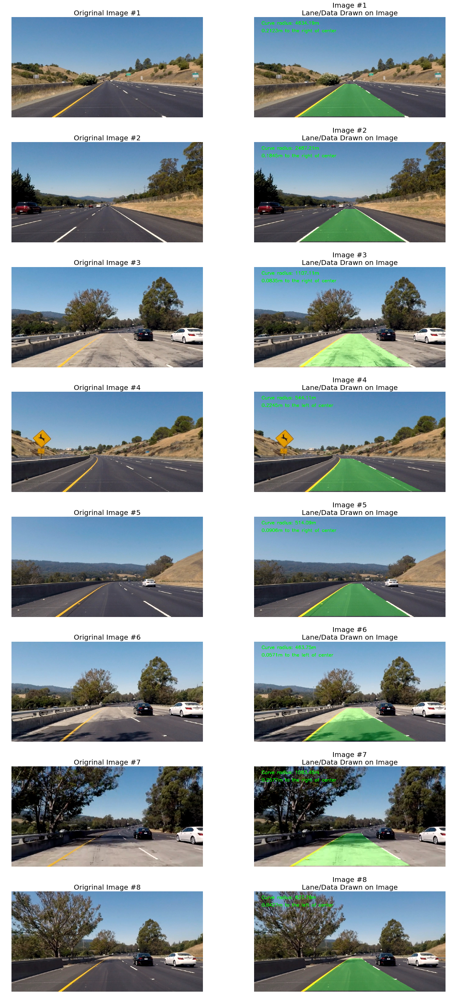

In [32]:
files = sorted(os.listdir("test_images"))
num_files = len(files)
this_file = 0
i_num = 1

fig_11 = plt.figure(figsize=(20,40))

for file in files:
    
    image = cv2.imread('test_images/' + file)
    image = crop(undistort_cal(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))
    
    warped_bin = lane_pixel_detection(image)
    
    left_fit, right_fit, left_fit_x, right_fit_x, ploty, out_img = sliding_window_search(warped_bin)
    
    left_curve, right_curve, distance = roc_and_distance(left_fit, right_fit, left_fit_x, right_fit_x, ploty)
    
    lined_image = draw_lane_lines(image, warped_bin, left_fit_x, right_fit_x, ploty)
    
    annotated_image = draw_roc_dist(lined_image, left_curve, right_curve, distance)
    
    a = fig_11.add_subplot(num_files, 2 , i_num*2-1)
    a.set_title('Origrinal Image #{:.0f}'.format(i_num), fontsize=20)
    plt.axis('off')
    plt.imshow(image)
    
    a = fig_11.add_subplot(num_files, 2, i_num*2)
    a.set_title('Image #{:.0f}\nLane/Data Drawn on Image'.format(i_num), fontsize=20)
    plt.axis('off')
    plt.imshow(annotated_image)
    
    i_num +=1
    
fig_11.tight_layout()
plt.savefig('output_images/lane_data.png')
plt.show()

# Applying the Pipeline to Video

In [17]:
# Create Helper functions
class Line():
    def __init__(self):
        # Was line detected in last frame
        self.detected = False
        
        # X values of the last n fits
        self.recent_fits = []
        
        # Average x values of the fitted line over the last n iterations
        self.best_x = None
        
        #Polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        
        #Polynomial coefficients for the most recent fit
        self.current_fit = None
        
        # Radius of curvature
        self.radius_of_curvature = None
        
        #Distance in meters of vehicle from the center line
        self.line_bas_position = None
        
        # Difference in fit coefficients between last and current fit
        self.diffs = np.array([0,0,0], dtype='float')

        
    def check_fit(self, line_fit):
            
        if line_fit is not None:
            if self.best_fit is not None:
                self.diffs = abs(line_fit - self.best_fit)
                    
            if (self.diffs[0] > 0.01 or self.diffs[1] > 1.0 or self.diffs[2]>50):
                self.detected = False
                
                if(len(self.recent_fits)>5):
                    self.recent_fits.pop(len(self.recent_fits) - 1)
                
                re_value = self.recent_fits[0]
                self.recent_fits.reverse()
                self.recent_fits.append(re_value)
                self.recent_fits.reverse()
                
                self.best_fit = np.average(self.recent_fits, axis=0)
                    
            else:
                self.detected = True
                    
                if(len(self.recent_fits)>5):
                    self.recent_fits.pop(len(self.recent_fits) - 1)
                    
                self.recent_fits.reverse()
                self.recent_fits.append(line_fit)
                self.recent_fits.reverse()
                
                self.best_fit = np.average(self.recent_fits, axis=0)
            
        else:
            self.detected = False
                
            if(len(self.recent_fits)>5):
                self.recent_fits.pop(len(self.recent_fits) - 1)
                
            re_value = self.recent_fits[0]
            self.recent_fits.reverse()
            self.recent_fits.append(re_value)
            self.recent_fits.reverse()
                
            self.best_fit = np.average(self.recent_fits, axis=0)
    
    def generate_xy(self):            
        if (self.best_fit is not None):
            # Generate x and y values for plotting
            line_y_vals = np.linspace(0, 669, 670 )
            line_x_vals= self.best_fit[0]*line_y_vals**2 + self.best_fit[1]*line_y_vals + self.best_fit[2]
            
            return line_x_vals, line_y_vals
        else:
            return None, None
    
    
            
    

In [20]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_frame(frame):

    #Crop and Undistort Frame
    cropped_frame = crop(undistort_cal(frame))

    #Perform Lane Line Pixel Detection
    warped_bin = lane_pixel_detection(cropped_frame)
    
    #Perform Sliding window search
    if (left_line.detected == False or right_line.detected == False):
        left_fit, right_fit, left_fit_x, right_fit_x, ploty, out_img = sliding_window_search(warped_bin)
    else:
        left_fit, right_fit, left_fit_x, right_fit_x, ploty, out_img = search_from_line(warped_bin, left_line.best_fit, right_line.best_fit)
    
    # Sanity check on x- intercept - x intercept of left and right lane lines should be approximately
    # 250 pixels apart
    y_max = 665
    
    if left_fit is not None and right_fit is not None:
        left_x_int = left_fit[0]*y_max**2 + left_fit[1]*y_max + left_fit[2]
        right_x_int = right_fit[0]*y_max**2 + right_fit[1]*y_max + right_fit[2]
        
        intercept_diff = abs(left_x_int - right_x_int)
        
        if intercept_diff > 275 or intercept_diff < 225:
            left_fit = None
            right_fit = None
    
    left_line.check_fit(left_fit)
    right_line.check_fit(right_fit)
    
    if (left_line.best_fit is not None and right_line.best_fit is not None):
    
        left_fit_x, ploty = left_line.generate_xy() 
        right_fit_x, ploty = right_line.generate_xy()
        lined_image = draw_lane_lines(cropped_frame, warped_bin, left_fit_x, right_fit_x, ploty)
        
        left_curve, right_curve, distance = roc_and_distance(left_line.best_fit, right_line.best_fit, left_fit_x, right_fit_x, ploty)
    
        annotated_image = draw_roc_dist(lined_image, left_curve, right_curve, distance)
    
        border_size = 50
        border=cv2.copyMakeBorder(annotated_image, top=0, bottom=border_size, left=0, right=0, borderType= cv2.BORDER_CONSTANT, value=[255,255,255] )

    return border
    
    
    
    
    

In [21]:
left_line = Line()
right_line = Line()
video_1_output = 'video_output/project_video_out.mp4'
video_1 = VideoFileClip("project_video.mp4")
video_clip = video_1.fl_image(process_frame)
%time video_clip.write_videofile(video_1_output, audio=False)


[MoviePy] >>>> Building video video_output/project_video_out.mp4
[MoviePy] Writing video video_output/project_video_out.mp4


100%|█████████▉| 1260/1261 [03:31<00:00,  6.17it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_output/project_video_out.mp4 

CPU times: user 17min 43s, sys: 29.6 s, total: 18min 13s
Wall time: 3min 31s


In [22]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_1_output))